In [3]:
%matplotlib inline

1. Predict with pre-trained Mask RCNN models
===============================================

This article shows how to play with pre-trained Mask RCNN model.

Mask RCNN networks are extensions to Faster RCNN networks.
:py:class:`gluoncv.model_zoo.MaskRCNN` is inherited from
:py:class:`gluoncv.model_zoo.FasterRCNN`.
It is highly recommended to read :doc:`../examples_detection/demo_faster_rcnn` first.

First let's import some necessary libraries:


In [1]:
from matplotlib import pyplot as plt
from gluoncv import model_zoo, data, utils

Load a pretrained model
-------------------------

Let's get an Mask RCNN model trained on COCO dataset with ResNet-50 backbone.
By specifying ``pretrained=True``, it will automatically download the model
from the model zoo if necessary. For more pretrained models, please refer to
:doc:`../../model_zoo/index`.

The returned model is a HybridBlock :py:class:`gluoncv.model_zoo.MaskRCNN`
with a default context of `cpu(0)`.



In [2]:
net = model_zoo.get_model('mask_rcnn_resnet50_v1b_coco', pretrained=True)

Pre-process an image
--------------------

The pre-processing step is identical to Faster RCNN.

Next we download an image, and pre-process with preset data transforms.
The default behavior is to resize the short edge of the image to 600px.
But you can feed an arbitrarily sized image.

You can provide a list of image file names, such as ``[im_fname1, im_fname2,
...]`` to :py:func:`gluoncv.data.transforms.presets.rcnn.load_test` if you
want to load multiple image together.

This function returns two results. The first is a NDArray with shape
`(batch_size, RGB_channels, height, width)`. It can be fed into the
model directly. The second one contains the images in numpy format to
easy to be plotted. Since we only loaded a single image, the first dimension
of `x` is 1.

Please beware that `orig_img` is resized to short edge 600px.



In [11]:
im_fname = utils.download('https://github.com/dmlc/web-data/blob/master/' +
                          'gluoncv/detection/biking.jpg?raw=true',
                          path='biking.jpg')
x, orig_img = data.transforms.presets.rcnn.load_test(im_fname)

Inference and display
---------------------

The Mask RCNN model returns predicted class IDs, confidence scores,
bounding boxes coordinates and segmentation masks.
Their shape are (batch_size, num_bboxes, 1), (batch_size, num_bboxes, 1)
(batch_size, num_bboxes, 4), and (batch_size, num_bboxes, mask_size, mask_size)
respectively. For the model used in this tutorial, mask_size is 14.

Object Detection results

We can use :py:func:`gluoncv.utils.viz.plot_bbox` to visualize the
results. We slice the results for the first image and feed them into `plot_bbox`:

Plot Segmentation

:py:func:`gluoncv.utils.viz.expand_mask` will resize the segmentation mask
and fill the bounding box size in the original image.
:py:func:`gluoncv.utils.viz.plot_mask` will modify an image to
overlay segmentation masks.



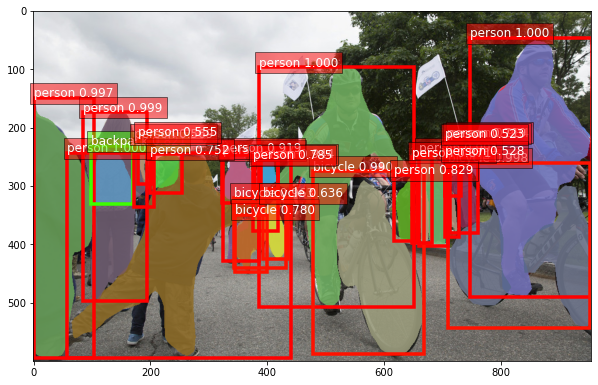

In [15]:
ids, scores, bboxes, masks = [xx[0].asnumpy() for xx in net(x)]

# paint segmentation mask on images directly
width, height = orig_img.shape[1], orig_img.shape[0]
masks, _ = utils.viz.expand_mask(masks, bboxes, (width, height), scores)
orig_img = utils.viz.plot_mask(orig_img, masks)

# identical to Faster RCNN object detection
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(1, 1, 1)
ax = utils.viz.plot_bbox(orig_img, bboxes, scores, ids,
                         class_names=net.classes, ax=ax)
plt.show()

In [5]:
import numpy as np
import cv2

# Capture video from file
cap = cv2.VideoCapture('./Dataset/10/rgb/0001_c4.mp4')
count = 0
while True:
    
    ret, frame = cap.read()
    #x, orig_img = data.transforms.presets.rcnn.load_test('./Dataset/10/depth/0000/c1/0000.png')
    if ret == True:
        cv2.imwrite('./mask/'+str(count)+'.jpg',frame)
        count=count+1

    else:
        break

cap.release()
cv2.destroyAllWindows()

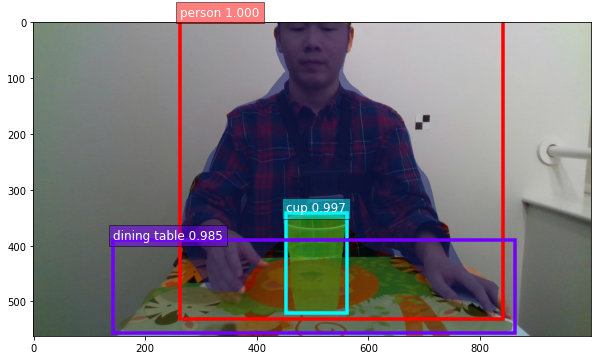

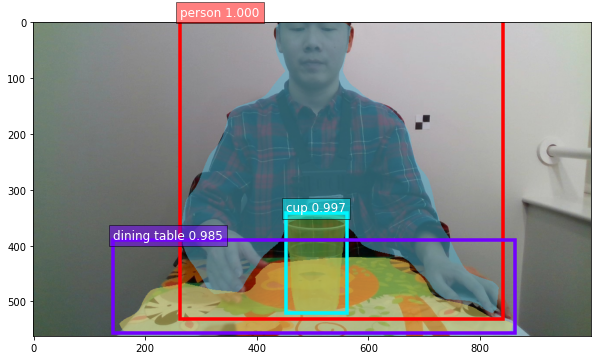

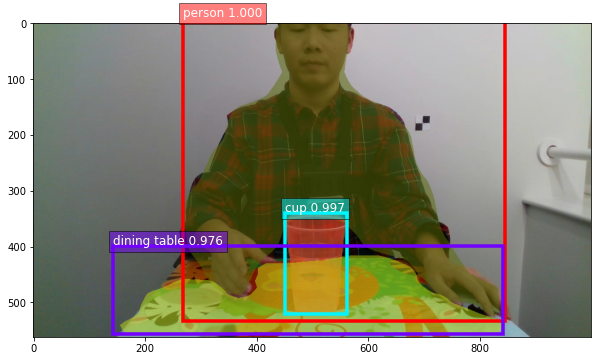

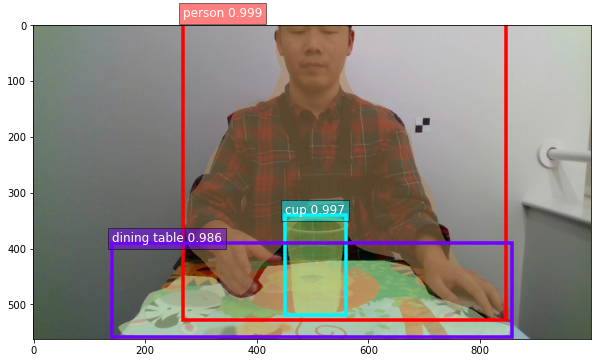

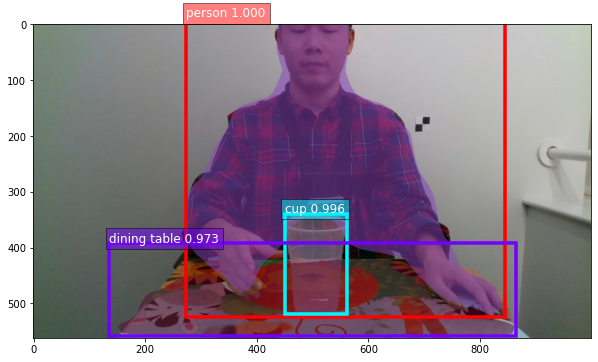

...

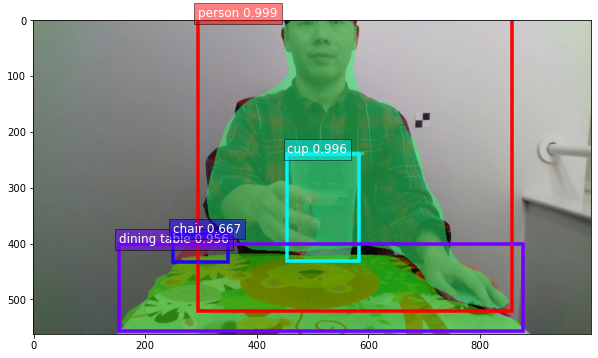

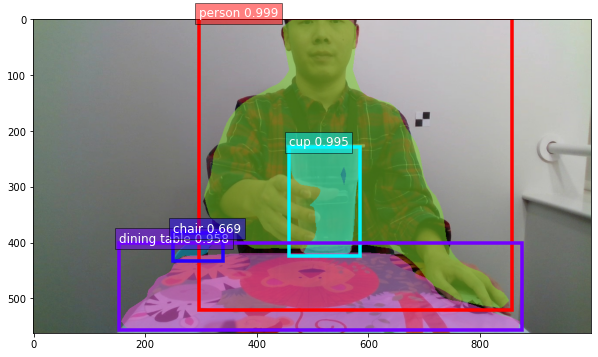

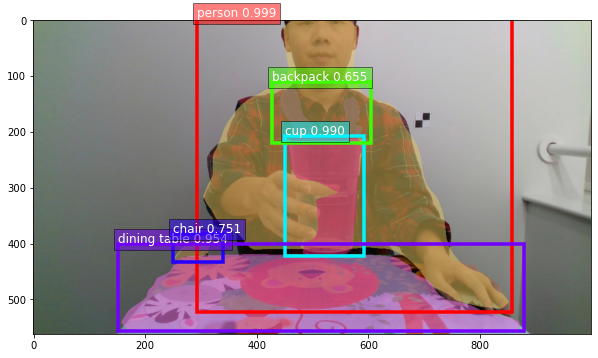

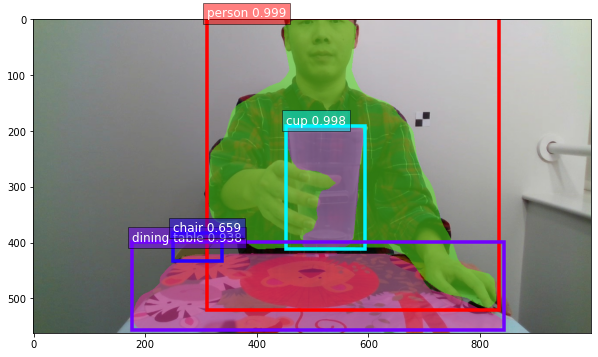

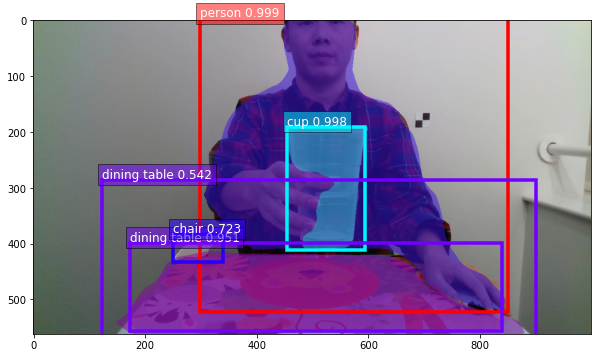

In [ ]:
for i in range(58):
    x, orig_img = data.transforms.presets.rcnn.load_test('./mask/'+str(i)+'.jpg')
    ids, scores, bboxes, masks = [xx[0].asnumpy() for xx in net(x)]

    # paint segmentation mask on images directly
    width, height = orig_img.shape[1], orig_img.shape[0]
    masks, _ = utils.viz.expand_mask(masks, bboxes, (width, height), scores)
    orig_img = utils.viz.plot_mask(orig_img, masks)

    # identical to Faster RCNN object detection
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(1, 1, 1)
    ax = utils.viz.plot_bbox(orig_img, bboxes, scores, ids,
                             class_names=net.classes, ax=ax)
    plt.show()

In [ ]:
./Dataset/10/rgb/0001_c4.mp4
in_put:'./Dataset/'+str(i)+'/rgb/'+str(j)+'_c'+str(k)
output:'./Dataset/'+str(i)+'/rgb_jpeg/'+str(j)+'c'+str(k)

In [9]:
for i in range(10):
    print('{0:04}'.format(i))

0000
0001
0002
0003
0004
0005
0006
0007
0008
0009


In [25]:
import numpy as np
import cv2

def generateframe(inputpath,outputpath,sub1,sub2): 
    # Capture video from file
    cap = cv2.VideoCapture(inputpath)
    count = 0
    while True:

        ret, frame = cap.read()
        #x, orig_img = data.transforms.presets.rcnn.load_test('./Dataset/10/depth/0000/c1/0000.png')
        if ret == True:
            cv2.imwrite(outputpath+'/'+sub1+'/c'+sub2+'/'+str(count)+'.jpg',frame)
            count=count+1

        else:
            break

    cap.release()
    cv2.destroyAllWindows()
    

In [27]:
for i in range(2,84):
    for j in range(1,5):
        input_path = './Dataset/10/rgb/'+'{0:04}'.format(i)+'_c'+str(j)+'.mp4'
        outputpath = './Dataset/10/rgb_jpeg/'
        sub1 = '{0:04}'.format(i)
        sub2 = str(j)
        print(input_path,outputpath,sub1,sub2)
        generateframe('./Dataset/10/rgb/'+'{0:04}'.format(i)+'_c'+str(j)+'.mp4','./Dataset/10/rgb_jpeg/','{0:04}'.format(i),str(j))

./Dataset/10/rgb/0002_c1.mp4 ./Dataset/10/rgb_jpeg/ 0002 1
./Dataset/10/rgb/0002_c2.mp4 ./Dataset/10/rgb_jpeg/ 0002 2
./Dataset/10/rgb/0002_c3.mp4 ./Dataset/10/rgb_jpeg/ 0002 3
./Dataset/10/rgb/0002_c4.mp4 ./Dataset/10/rgb_jpeg/ 0002 4
./Dataset/10/rgb/0003_c1.mp4 ./Dataset/10/rgb_jpeg/ 0003 1
./Dataset/10/rgb/0003_c2.mp4 ./Dataset/10/rgb_jpeg/ 0003 2
./Dataset/10/rgb/0003_c3.mp4 ./Dataset/10/rgb_jpeg/ 0003 3
./Dataset/10/rgb/0003_c4.mp4 ./Dataset/10/rgb_jpeg/ 0003 4
./Dataset/10/rgb/0004_c1.mp4 ./Dataset/10/rgb_jpeg/ 0004 1
./Dataset/10/rgb/0004_c2.mp4 ./Dataset/10/rgb_jpeg/ 0004 2
./Dataset/10/rgb/0004_c3.mp4 ./Dataset/10/rgb_jpeg/ 0004 3
./Dataset/10/rgb/0004_c4.mp4 ./Dataset/10/rgb_jpeg/ 0004 4
./Dataset/10/rgb/0005_c1.mp4 ./Dataset/10/rgb_jpeg/ 0005 1
./Dataset/10/rgb/0005_c2.mp4 ./Dataset/10/rgb_jpeg/ 0005 2
./Dataset/10/rgb/0005_c3.mp4 ./Dataset/10/rgb_jpeg/ 0005 3
./Dataset/10/rgb/0005_c4.mp4 ./Dataset/10/rgb_jpeg/ 0005 4
./Dataset/10/rgb/0006_c1.mp4 ./Dataset/10/rgb_jpeg/ 0006

./Dataset/10/rgb/0036_c4.mp4 ./Dataset/10/rgb_jpeg/ 0036 4
./Dataset/10/rgb/0037_c1.mp4 ./Dataset/10/rgb_jpeg/ 0037 1
./Dataset/10/rgb/0037_c2.mp4 ./Dataset/10/rgb_jpeg/ 0037 2
./Dataset/10/rgb/0037_c3.mp4 ./Dataset/10/rgb_jpeg/ 0037 3
./Dataset/10/rgb/0037_c4.mp4 ./Dataset/10/rgb_jpeg/ 0037 4
./Dataset/10/rgb/0038_c1.mp4 ./Dataset/10/rgb_jpeg/ 0038 1
./Dataset/10/rgb/0038_c2.mp4 ./Dataset/10/rgb_jpeg/ 0038 2
./Dataset/10/rgb/0038_c3.mp4 ./Dataset/10/rgb_jpeg/ 0038 3
./Dataset/10/rgb/0038_c4.mp4 ./Dataset/10/rgb_jpeg/ 0038 4
./Dataset/10/rgb/0039_c1.mp4 ./Dataset/10/rgb_jpeg/ 0039 1
./Dataset/10/rgb/0039_c2.mp4 ./Dataset/10/rgb_jpeg/ 0039 2
./Dataset/10/rgb/0039_c3.mp4 ./Dataset/10/rgb_jpeg/ 0039 3
./Dataset/10/rgb/0039_c4.mp4 ./Dataset/10/rgb_jpeg/ 0039 4
./Dataset/10/rgb/0040_c1.mp4 ./Dataset/10/rgb_jpeg/ 0040 1
./Dataset/10/rgb/0040_c2.mp4 ./Dataset/10/rgb_jpeg/ 0040 2
./Dataset/10/rgb/0040_c3.mp4 ./Dataset/10/rgb_jpeg/ 0040 3
./Dataset/10/rgb/0040_c4.mp4 ./Dataset/10/rgb_jpeg/ 0040

./Dataset/10/rgb/0071_c3.mp4 ./Dataset/10/rgb_jpeg/ 0071 3
./Dataset/10/rgb/0071_c4.mp4 ./Dataset/10/rgb_jpeg/ 0071 4
./Dataset/10/rgb/0072_c1.mp4 ./Dataset/10/rgb_jpeg/ 0072 1
./Dataset/10/rgb/0072_c2.mp4 ./Dataset/10/rgb_jpeg/ 0072 2
./Dataset/10/rgb/0072_c3.mp4 ./Dataset/10/rgb_jpeg/ 0072 3
./Dataset/10/rgb/0072_c4.mp4 ./Dataset/10/rgb_jpeg/ 0072 4
./Dataset/10/rgb/0073_c1.mp4 ./Dataset/10/rgb_jpeg/ 0073 1
./Dataset/10/rgb/0073_c2.mp4 ./Dataset/10/rgb_jpeg/ 0073 2
./Dataset/10/rgb/0073_c3.mp4 ./Dataset/10/rgb_jpeg/ 0073 3
./Dataset/10/rgb/0073_c4.mp4 ./Dataset/10/rgb_jpeg/ 0073 4
./Dataset/10/rgb/0074_c1.mp4 ./Dataset/10/rgb_jpeg/ 0074 1
./Dataset/10/rgb/0074_c2.mp4 ./Dataset/10/rgb_jpeg/ 0074 2
./Dataset/10/rgb/0074_c3.mp4 ./Dataset/10/rgb_jpeg/ 0074 3
./Dataset/10/rgb/0074_c4.mp4 ./Dataset/10/rgb_jpeg/ 0074 4
./Dataset/10/rgb/0075_c1.mp4 ./Dataset/10/rgb_jpeg/ 0075 1
./Dataset/10/rgb/0075_c2.mp4 ./Dataset/10/rgb_jpeg/ 0075 2
./Dataset/10/rgb/0075_c3.mp4 ./Dataset/10/rgb_jpeg/ 0075

In [19]:
a=[]
for i in range(84):
    a.append('{0:04}'.format(i))
a

['0000',
 '0001',
 '0002',
 '0003',
 '0004',
 '0005',
 '0006',
 '0007',
 '0008',
 '0009',
 '0010',
 '0011',
 '0012',
 '0013',
 '0014',
 '0015',
 '0016',
 '0017',
 '0018',
 '0019',
 '0020',
 '0021',
 '0022',
 '0023',
 '0024',
 '0025',
 '0026',
 '0027',
 '0028',
 '0029',
 '0030',
 '0031',
 '0032',
 '0033',
 '0034',
 '0035',
 '0036',
 '0037',
 '0038',
 '0039',
 '0040',
 '0041',
 '0042',
 '0043',
 '0044',
 '0045',
 '0046',
 '0047',
 '0048',
 '0049',
 '0050',
 '0051',
 '0052',
 '0053',
 '0054',
 '0055',
 '0056',
 '0057',
 '0058',
 '0059',
 '0060',
 '0061',
 '0062',
 '0063',
 '0064',
 '0065',
 '0066',
 '0067',
 '0068',
 '0069',
 '0070',
 '0071',
 '0072',
 '0073',
 '0074',
 '0075',
 '0076',
 '0077',
 '0078',
 '0079',
 '0080',
 '0081',
 '0082',
 '0083']